In [3]:
import os 
from glob import glob
from tqdm import tqdm 
from PIL import Image
import torch 
from torchvision.transforms import v2 as transformsv2

In [4]:
db_img_dir = "../../MIT_small_train_1/test/"
query_img_dir = "../../MIT_small_train_1/train/"

# all db images
db_img_paths = glob(db_img_dir + "**/*.jpg")
query_img_paths = glob(query_img_dir + "**/*.jpg")

assert len(db_img_paths) > 0, "No images in db folder"
assert len(query_img_paths) > 0, "No images in query folder"


# model path 
model_path = "/ghome/group04/MCV-C5-G4/week3/siamese/siamese_resnet18.pt"

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"

# load model
model = torch.load(model_path, map_location=torch.device('cpu'))

if not isinstance(model, torch.nn.Module):
    raise TypeError("The loaded object is not a PyTorch model.")
#model.to(device)
model.eval()

transforms = transformsv2.Compose(
    [
        transformsv2.RandomResizedCrop(size=(224, 224), antialias=True),
        transformsv2.ToTensor(),
        transformsv2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

/ghome/group04/MCV-C5-G4/.cvc/lib/python3.8/site-packages/torchvision/transforms/v2/_deprecated.py:41: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


In [6]:
with torch.no_grad():
    db_img_features = {
        
    }
    for img_path in tqdm(db_img_paths, desc="Extracting db features"):
        img = Image.open(img_path).convert("RGB")
        img = transforms(img).unsqueeze(0).to(device)
        feature = model(img)
        # flatten the tensor
        feature = feature.view(feature.size(0), -1)[0]
        db_img_features[img_path] = {
            "feature": feature.cpu().numpy(),
            "label": img_path.split("/")[-2]
        }

    query_img_features = {}
    for img_path in tqdm(query_img_paths, desc="Extracting query features"):
        img = Image.open(img_path).convert("RGB")
        img = transforms(img).unsqueeze(0).to(device)
        feature = model(img)
        feature = feature.view(feature.size(0), -1)[0]
        query_img_features[img_path] = {
            "feature": feature.cpu().numpy(),
            "label": img_path.split("/")[-2],
        }

Extracting query features: 100%|██████████| 400/400 [00:09<00:00, 43.33it/s]


In [7]:
from sklearn.metrics import average_precision_score

# Initialize variables for metrics calculation
map_1_scores = []
map_5_scores = []
accuracies = []
recalls = []
precisions = []
f1_scores = []

# find top k similar images(k = 5)
k = 5
similar_images = {}

for key, val in tqdm(query_img_features.items(), desc="Finding similar images"):
    query_feature = val["feature"]
    query_label = val["label"]
    similar_images[key] = {
        "label": query_label,
        "similar_images": []
    }
    ground_truth = []  # Ground truth labels for the current query
    scores = []  # Similarity scores for the current query
    for db_key, db_val in tqdm(db_img_features.items(), desc="Querying similar images"):
        db_feature = db_val["feature"]
        db_label = db_val["label"]
        distance = torch.nn.functional.pairwise_distance(
            torch.from_numpy(query_feature), torch.from_numpy(db_feature)
        )
        similar_images[key]["similar_images"].append(
            {
                "img_path": db_key,
                "distance": distance.item(),
                "label": db_label
            }
        )
    
        similarity_score = -distance.item()  # Use negative distance as similarity score
        scores.append(similarity_score)
        if db_label == query_label:
            ground_truth.append(1)  # Relevant image
        else:
            ground_truth.append(0)  # Irrelevant image

    similar_images[key]["similar_images"] = sorted(
        similar_images[key]["similar_images"], key=lambda x: x["distance"]
    )[:k]

    # Retrieve top k similar images
    top_k = sorted(
        zip(db_img_features.keys(), scores, ground_truth),
        key=lambda x: x[1],  # Sort by similarity scores
        reverse=True)[:k]

    # Calculate precision at k
    precision_at_k = sum(gt for _, _, gt in top_k) / k

    # Calculate AP@1
    if k >= 1:
        ap_1 = precision_at_k
        map_1_scores.append(ap_1)

    # Calculate AP@5
    if k >= 5:
        ap_5 = sum(gt for _, _, gt in top_k[:5]) / 5
        map_5_scores.append(ap_5)

    # Calculate accuracy, recall, and precision
    true_positives = sum(gt for _, _, gt in top_k)
    total_positives = len([gt for _, _, gt in top_k if gt == 1])
    total_queries = len(top_k)

    accuracy = true_positives / total_queries
    recall = true_positives / total_positives if total_positives != 0 else 0
    precision = true_positives / total_queries

    accuracies.append(accuracy)
    recalls.append(recall)
    precisions.append(precision)

    # Calculate F1 score
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) != 0 else 0
    f1_scores.append(f1_score)

# Calculate MAP@1 and MAP@5
map_1 = sum(map_1_scores) / len(map_1_scores)
map_5 = sum(map_5_scores) / len(map_5_scores)

# Calculate average accuracy, recall, precision, and F1 score
average_accuracy = sum(accuracies) / len(accuracies)
average_recall = sum(recalls) / len(recalls)
average_precision = sum(precisions) / len(precisions)
average_f1_score = sum(f1_scores) / len(f1_scores)

print(f"MAP@1: {map_1:.4f}")
print(f"MAP@5: {map_5:.4f}")
print(f"Average Accuracy: {average_accuracy:.4f}")
print(f"Average Recall: {average_recall:.4f}")
print(f"Average Precision: {average_precision:.4f}")
print(f"Average F1 Score: {average_f1_score:.4f}")


Finding similar images: 100%|██████████| 400/400 [00:17<00:00, 22.73it/s]

MAP@1: 0.8295
MAP@5: 0.8295
Average Accuracy: 0.8295
Average Recall: 0.9775
Average Precision: 0.8295
Average F1 Score: 0.8780


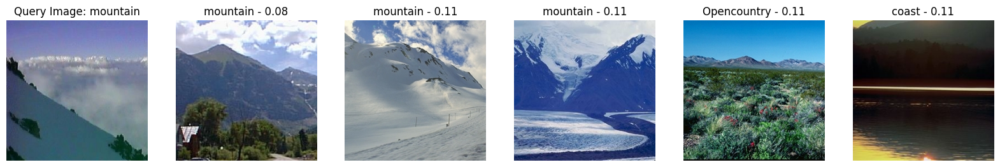

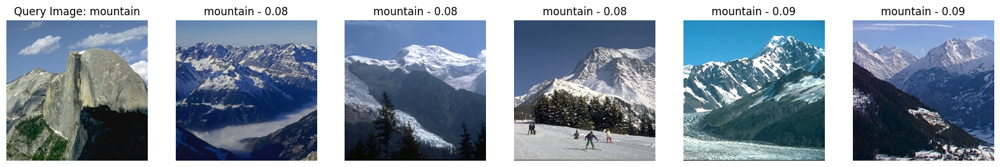

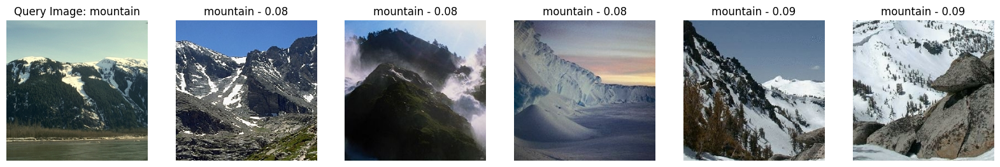

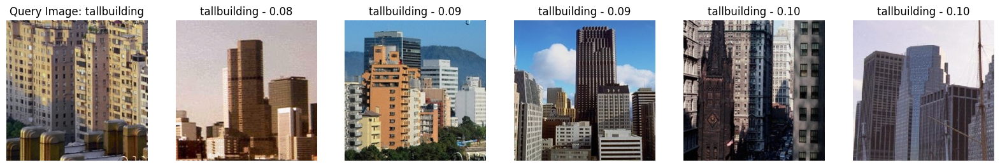

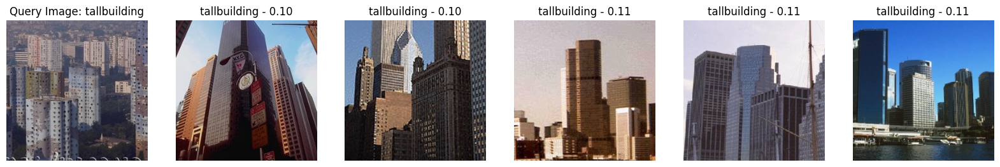

...

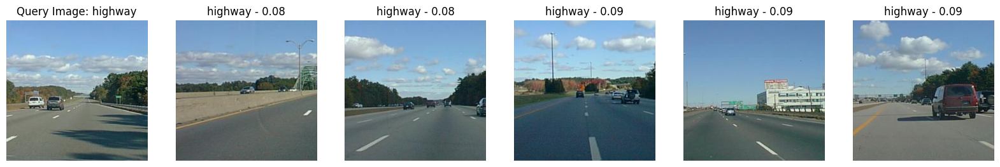

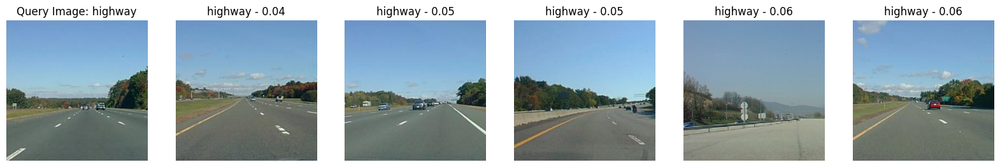

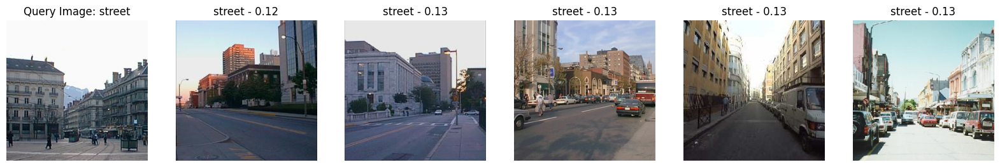

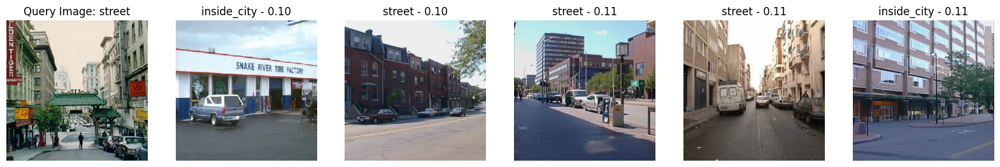

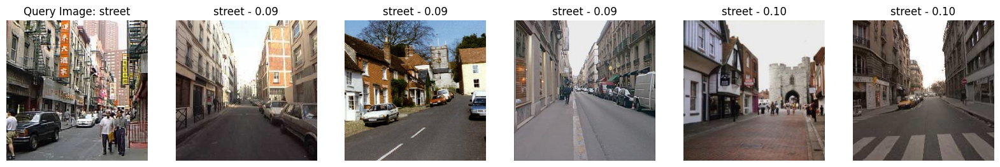

In [8]:
# visualize the results
import matplotlib.pyplot as plt
import numpy as np
import random

def visualize_results(similar_images,  k=5):
    tracker  = {}
    for key, val in similar_images.items():
        query_img = Image.open(key).convert("RGB")
        query_label = val["label"]
        
        if query_label not in tracker:
            tracker[query_label] = 1
        else:
            tracker[query_label] += 1
        if tracker[query_label] > 3:
            continue
        plt.figure(figsize=(20, 10))
        plt.subplot(1, k + 1, 1)
        plt.title(f"Query Image: {query_label}")
        plt.imshow(query_img)
        plt.axis("off")
        for i in range(k):
            img_path = val["similar_images"][i]["img_path"]
            label = val["similar_images"][i]["label"]
            img = Image.open(img_path).convert("RGB")
            plt.subplot(1, k + 1, i + 2)
            plt.title(f"{label} - {val['similar_images'][i]['distance']:.2f}")
            plt.imshow(img)
            plt.axis("off")
        plt.show()
        print("\n\n")

visualize_results(similar_images, k=5)

In [9]:
import numpy as np

# Assuming db_img_features is your feature dictionary
features_list = []
labels_list = []

for img_path, info in db_img_features.items():
    features_list.append(info["feature"])  # Add the feature numpy array
    labels_list.append(info["label"])  # Add the label

# Convert lists to numpy arrays
features_array = np.vstack(features_list)  # Stack feature vectors
labels_array = np.array(labels_list)  # Labels

In [10]:
from sklearn.manifold import TSNE

# Initialize t-SNE
tsne = TSNE(n_components=2, random_state=42)

# Fit and transform the data
tsne_results = tsne.fit_transform(features_array)

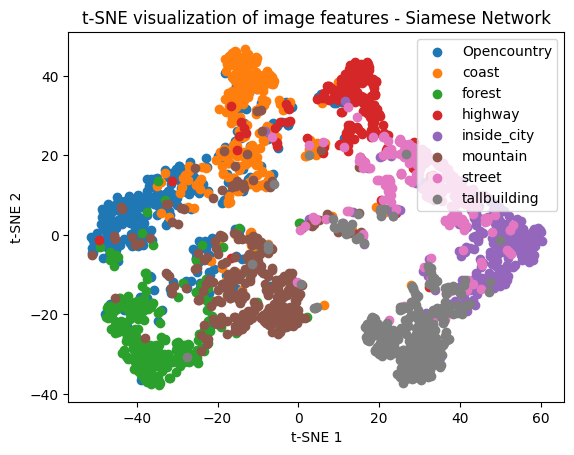

In [11]:
import matplotlib.pyplot as plt

# Create a scatter plot
unique_labels = np.unique(labels_array)
for label in unique_labels:
    # Filter points belonging to the current label
    idx = labels_array == label
    plt.scatter(tsne_results[idx, 0], tsne_results[idx, 1], label=label)

plt.legend()
plt.title("t-SNE visualization of image features - Siamese Network")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.show()